# **STOMPX**
## Stochastic propagations on networks with application to malware
[GitHub_repository](https://github.com/rrodgar/stompx)

In [1]:
import networkx as nx
import stompx as sx

## **A Quick-Example**
 A small network is created with networkx and a SIR model type is propagated over the network

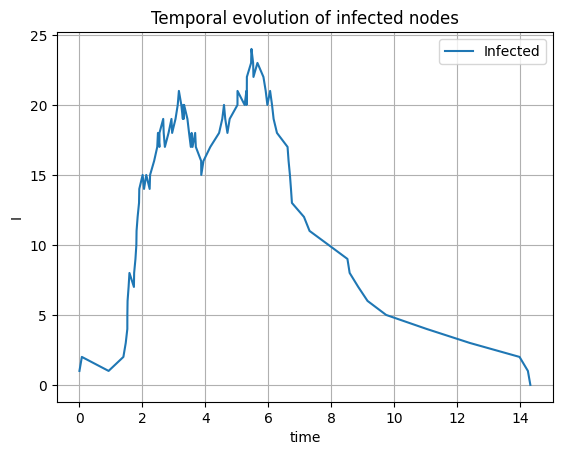

In [2]:
G = nx.powerlaw_cluster_graph(50, m = 3, p = 0.4 , seed = 42)

model1 = sx.Gillespie_SIR_Network(
    G = G,
    beta = 0.4,
    gamma= 0.3,
    num_initial_infected=1
)
model1.run_simulation(tmax=30)
sx.plot_infected_curve(model1)

An interactive animation can be created using the library

In [3]:
sx.plot_animation(network=G,model=model1)

In [ ]:
sx.statistics_summary(model=model1)
sx.resumen_red(G)

Outbreak statistics summary
-----------------------------------
Number of simulations      : 100
Mean I_max                 : 24.70 ± 10.98
Extinction probability     : 0.140
Mean extinction time       : 11.89
-----------------------------------


{'N': 50,
 'avg_k': np.float64(5.6),
 'C': 0.44252380952380954,
 'rho(A)': np.float64(8.158031902893025)}

## **A case of study**

## **Creating a new model**

In [50]:
from stompx.models import Montecarlo_SIR_Network
import numpy as np
class MonteCarlo_SEIR_Toymodel(Montecarlo_SIR_Network):
    def __init__(self, G, gamma, num_initial_infected, beta, sigma,initial_inf_method='aleatorio'):
         self.G = G
         self.gamma = gamma
         self.num_initial_infected = num_initial_infected
         #self.h = h
         self.initial_inf_method = initial_inf_method
         self.beta = beta
         self.sigma = sigma
    def new_state(self, node, states_old):
        state = states_old[node]
        r = np.random.rand()
        if state == "S":
                inf_neighbors = [i for i in self.G.neighbors(node) if states_old[i]=='I']
                l_inf_neighbors = len(inf_neighbors)

                if r < (1 - (1 - self.beta) ** l_inf_neighbors):
                    return 'E'

        elif state == "E":
                if r < self.sigma:
                    return 'I'

        elif state == "I":
                if r < self.gamma:
                    return  "R"
        return state
    # def new_state(self, node, states_old):
    
    #     state = states_old[node]
    #     r = np.random.rand()
    #     if state =='I':
    #         return 'R' if (r < self.gamma) else 'I'
    #     elif state =='S':
            
    #         inf_neighbors = [i for i in self.G.neighbors(node) if states_old[i]=='I']
    #         kv = len(inf_neighbors)
    #         if kv == 0:
    #             p = 0
    #         else:
    #             p = 1/(1 + np.exp(0.5  - kv ))            
    #         return 'I' if (r < p) else 'S'
        
    #     else:
    #         return 'R' 

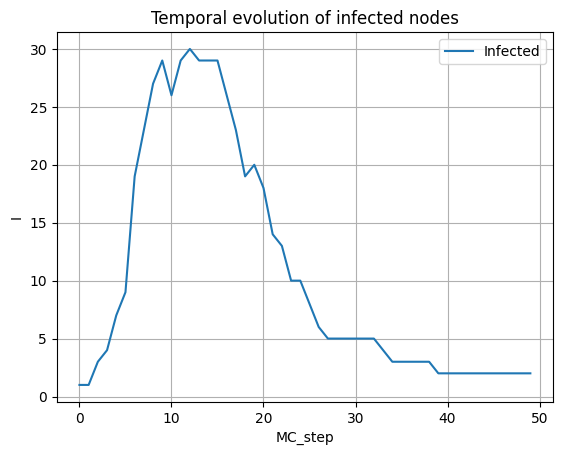

[['S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'I', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S'], ['S', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'E', 'S', 'E', 'I', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'S'], ['S', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'I', 'S', 'I', 'I', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'S'], ['S', 'S', 'E', 'E', 'E', 'S', 'S', 'S', 'E', 'I', 'S', 'I', 'I', 'S', 'E', 'E', 'S', 'S', 'S', 'S', 'E', 'S', 'E', 'S', 'S', 'S', 'S', 'S', 'E', 'S', 'E', 'E', 'S', 'E', 'E', 'E', 'S', 'S', 'E', 'S', 'S', 'S', 'S', 'I', 'S', 'S', 'S', 'S', 'S

In [ ]:
toymodel = MonteCarlo_SEIR_Toymodel(G=G, gamma=0.1,beta=0.85, sigma=0.25,num_initial_infected=1)
toymodel.run_simulation(steps=50)
sx.plot_infected_curve(toymodel, gillespie=False)
state_colors = {
    'S': 'blue',
    'E': 'orange',
    'I': 'red',
    'R': 'green'
}
print(toymodel.network_history)
sx.plot_animation(network=G,model = toymodel,state_colors=state_colors)


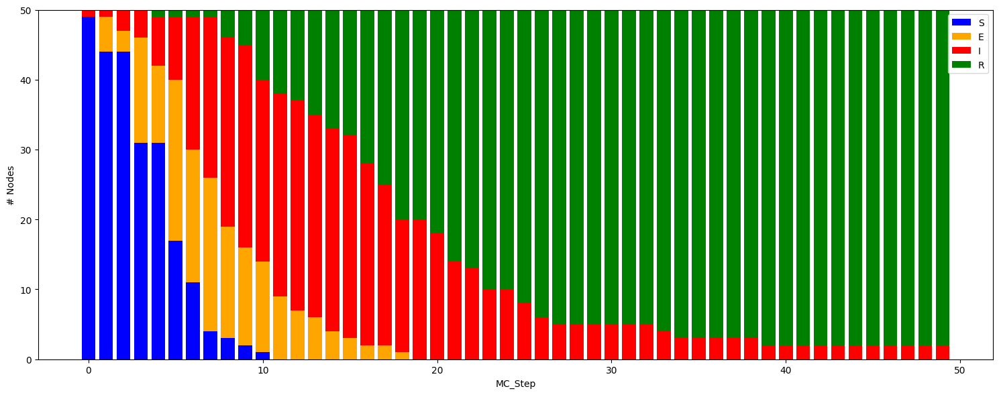

In [53]:
sx.plot_bars(toymodel, state_colors=state_colors, gillespie=False)

## **References**